# High Dim Compute Squared Euclidean Distance (+Normalize)

### Front matter
ADD (D//8) * ( (N//8) * 64 + (N%8) * 8 + 7*8 + N*8 ) + (D%8) * (8 * (N//8) + (N%8) + 7 +N )
MUL D + 1

### Main AVX
ADD (N//8) * (112*D + 448 + ( (N//8) -1) * (64*D + 256) + (N%8)*(2*D + 8) )
MUL (N//8) * (56*D + 56 + ( (N//8) -1) * (32*D + 4) + (N%8)*(1*D + 1) )

In [ ]:
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt

from visualization import plot

mpl.rcParams['figure.figsize'] = (8.1, 5)
mpl.rcParams['figure.dpi'] = 600
mpl.rcParams['font.family'] = 'Roboto'
mpl.rcParams['font.size'] = 15

Lets define the flops depending on the input size.

In [2]:
def get_flops(N, d):
    W = 2*N+2*d + N*d + (1.5)*d*N*(N-1)
    return W

def get_flops_avx(N, d):
    W = (d//8) * ( (N//8) * 64 + (N%8) * 8 + 7*8 + N*8 ) + (d%8) * (8 * (N//8) + (N%8) + 7 +N )
    W += d + 1
    W += 2
    W += (N//8) * (112*d + 448 + ( (N//8) -1) * (64*d + 256) + (N%8)*(2*d + 8) )
    W += (N//8) * (56*d + 56 + ( (N//8) -1) * (32*d + 4) + (N%8)*(1*d + 1) )
    return W

In [3]:
data_non2 = pd.read_csv("./bench_nonpower2.csv")
data_2 = pd.read_csv("./bench_power2.csv")
data = pd.concat([data_2, data_non2])
func_names = data.columns.values[2:]

/usr/local/lib/python3.6/site-packages/matplotlib/font_manager.py:1297: UserWarning: findfont: Font family ['Roboto'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


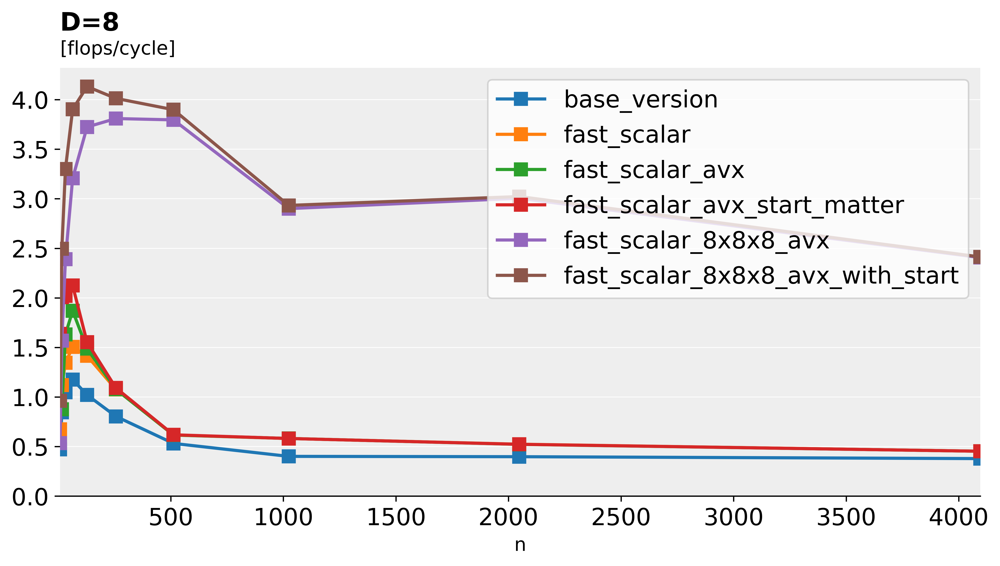

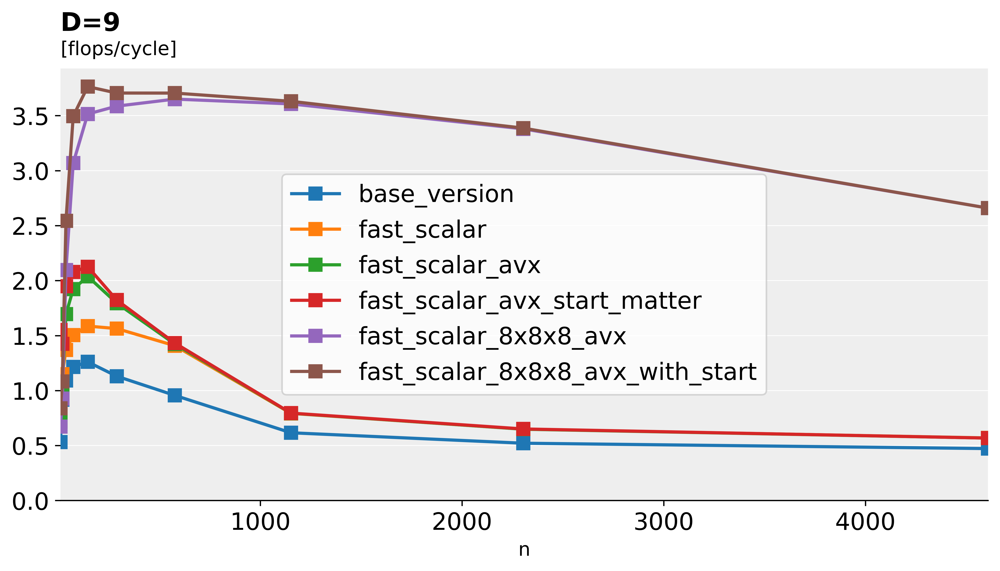

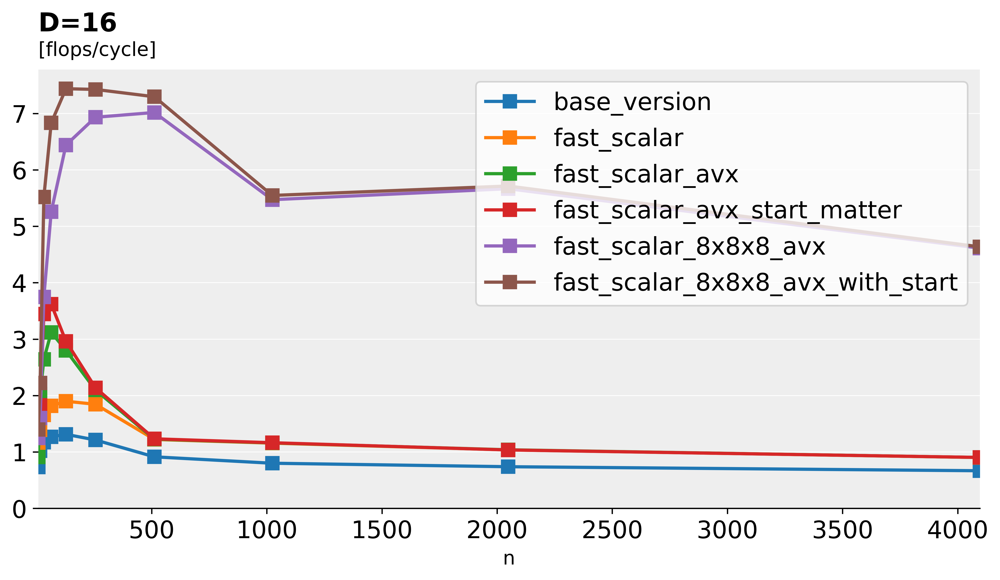

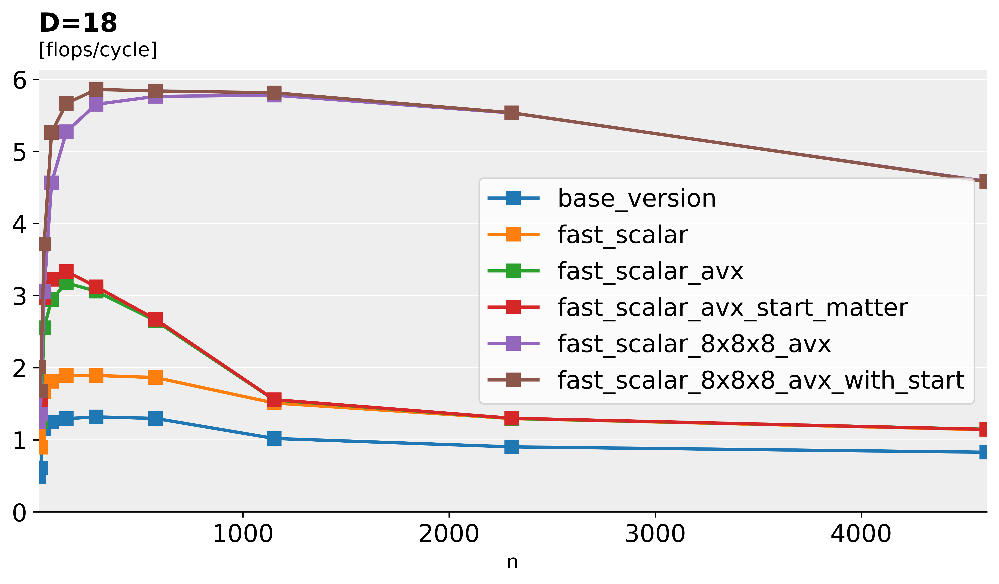

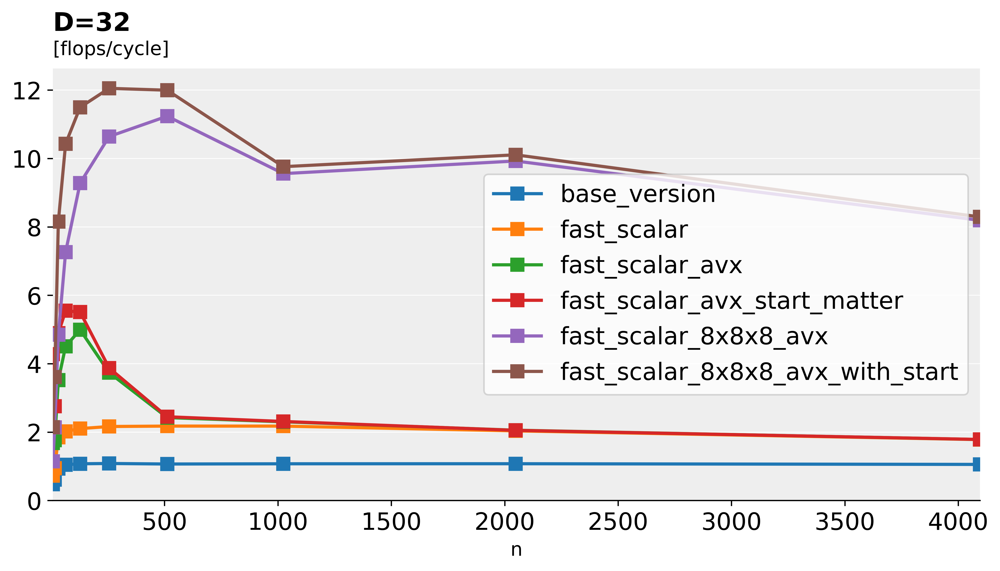

...

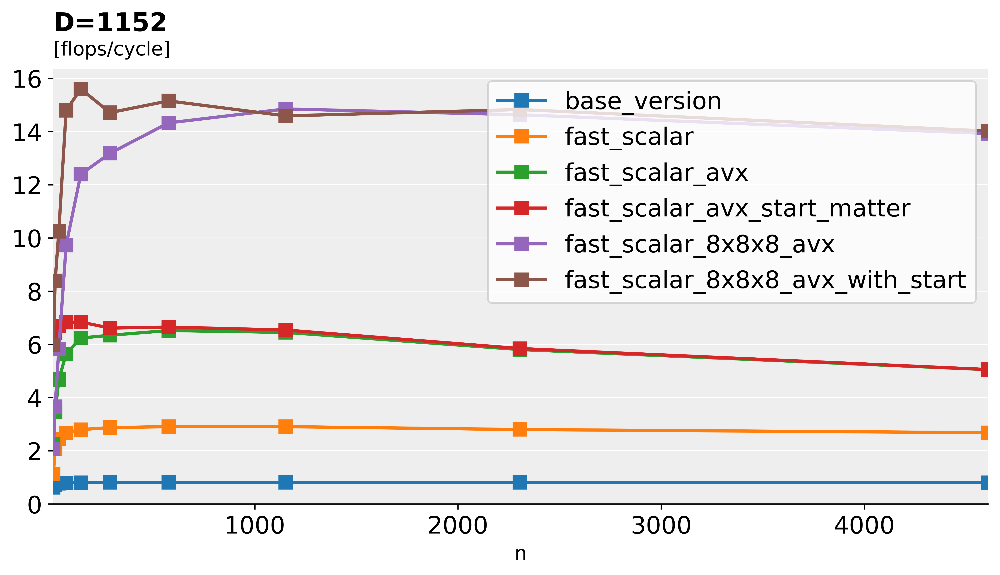

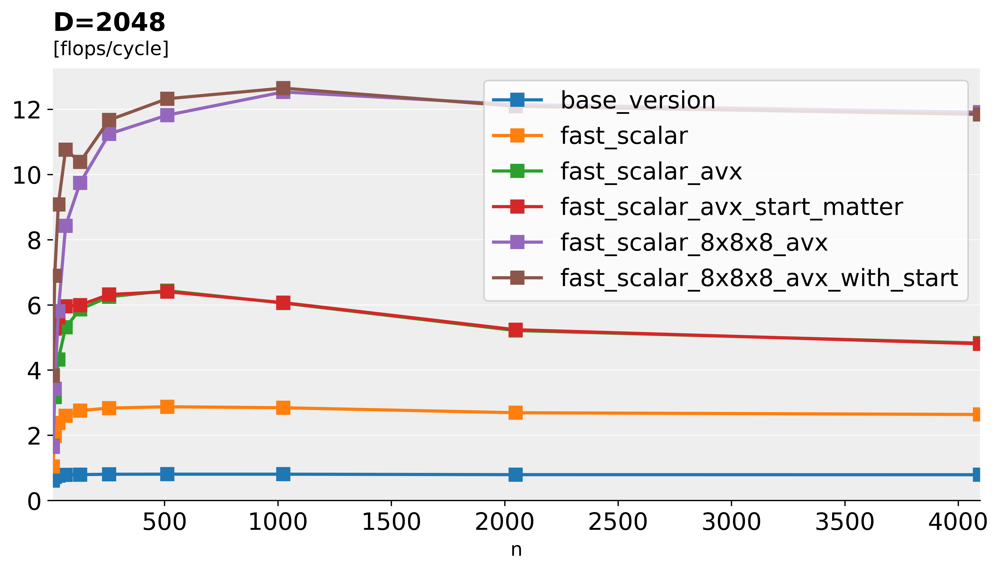

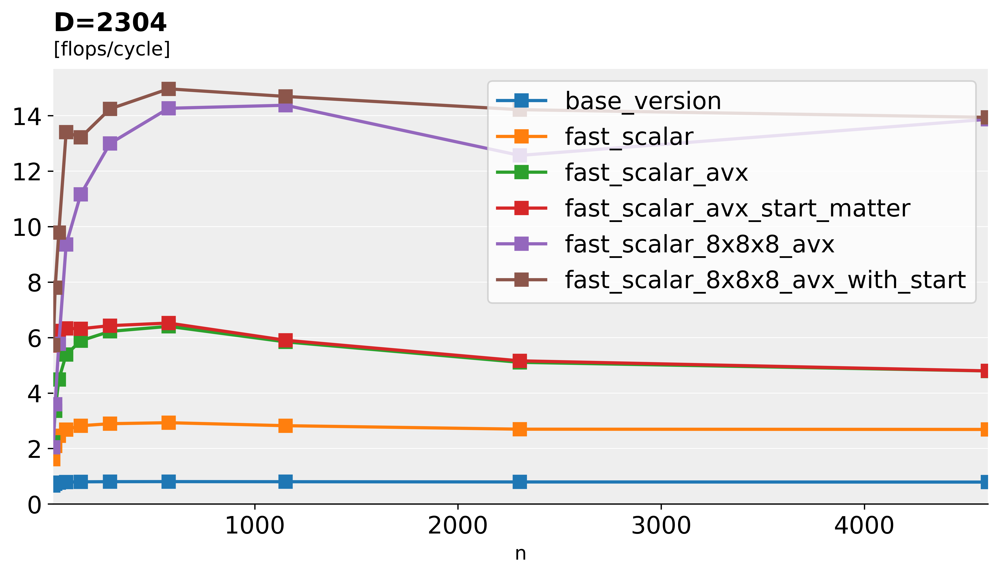

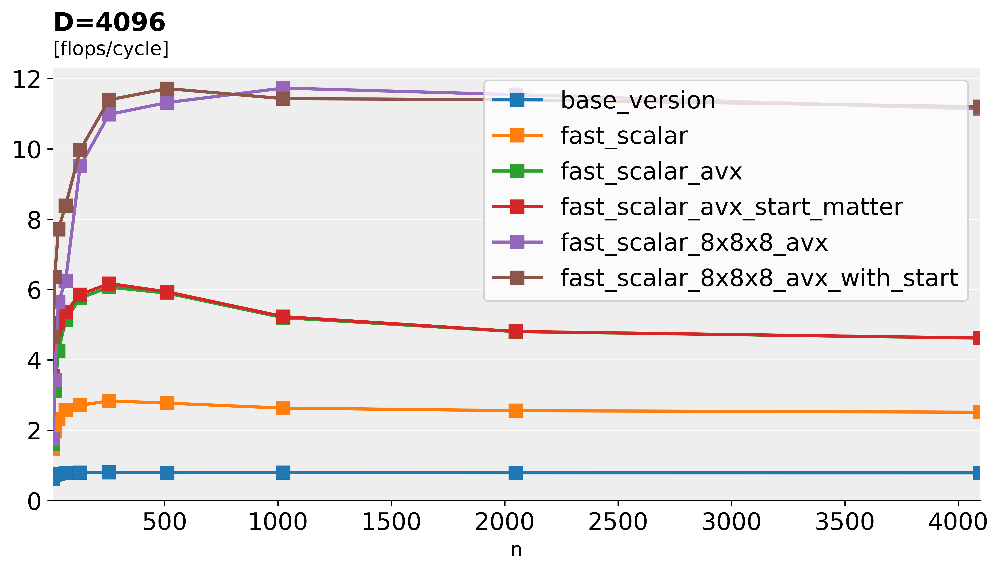

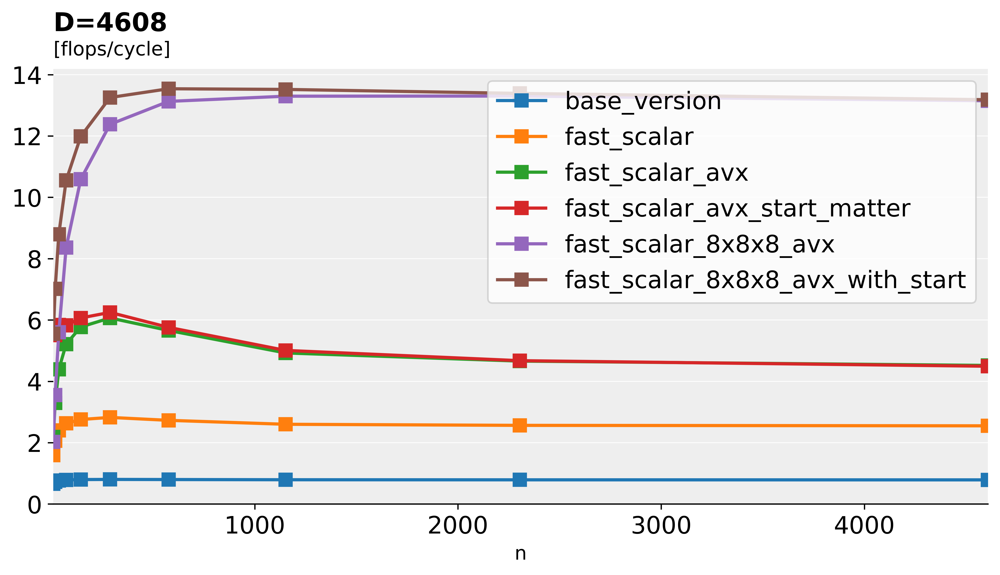

In [5]:
# N = list(sorted(data['N'].unique()))
D = list(sorted(data['D'].unique()))

for d in D:
    data_d = data.loc[data['D'] == d]
    N = data_d['N'].as_matrix()
    flops = get_flops(N, d)
    perf = []
    speedup = []
    cycles_base = data_d[func_names[0]].as_matrix()
    for func in func_names:
        cycles = data_d[func].as_matrix()
        P = flops / cycles
        S = cycles_base/cycles
        perf.append(P)
        speedup.append(S)
#     print(len(perf))
    plot(N, perf, labels=func_names, ylim=None, title="D="+str(d))    
    plt.show()
#     plot(N, speedup, labels=func_names, ylim=None, ylabel="Speedup", title="Speedup D="+str(d))    
#     plt.show()